In [3]:
suppressMessages(library(tidyverse))
suppressMessages(library(parallel))
suppressMessages(library(Seurat))
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(randomForest))
suppressMessages(library(harmony))
library(Seurat)
library(dplyr)
library(tidyverse)
library(ggplot2)
library(Seurat)
library(sf)
library(RColorBrewer)
library(ggdendro)
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(harmony))
library(pvclust)

Linking to GEOS 3.11.0, GDAL 3.5.2, PROJ 9.0.1; sf_use_s2() is TRUE



 num [1:76, 1:77] 2991 238 336 98 79 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:76] "Astrocytes_0" "Astrocytes_1" "Astrocytes_2" "Astrocytes_3" ...
  ..$ : chr [1:77] "Astrocytes_0" "Astrocytes_1" "Astrocytes_2" "Astrocytes_3" ...


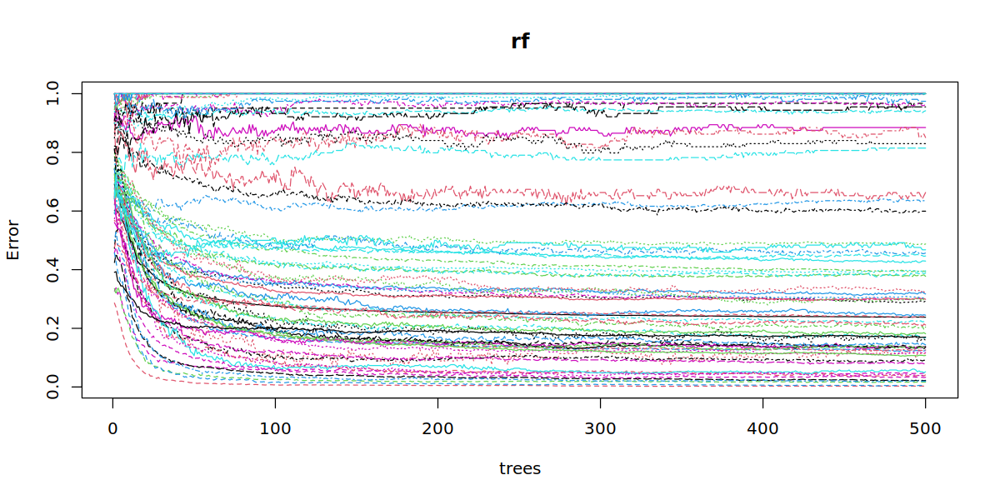

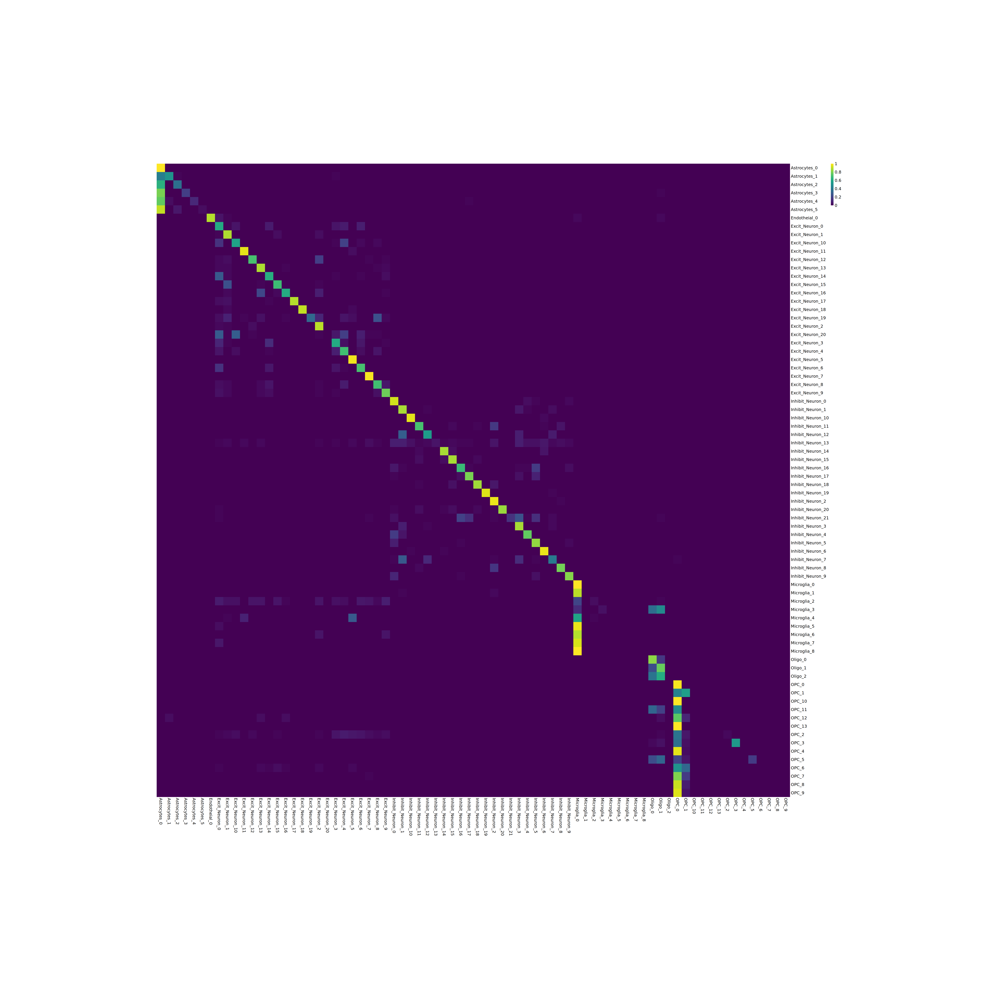

[1] 76

[1] 48

[1] 19

[1] 20

[1] 9

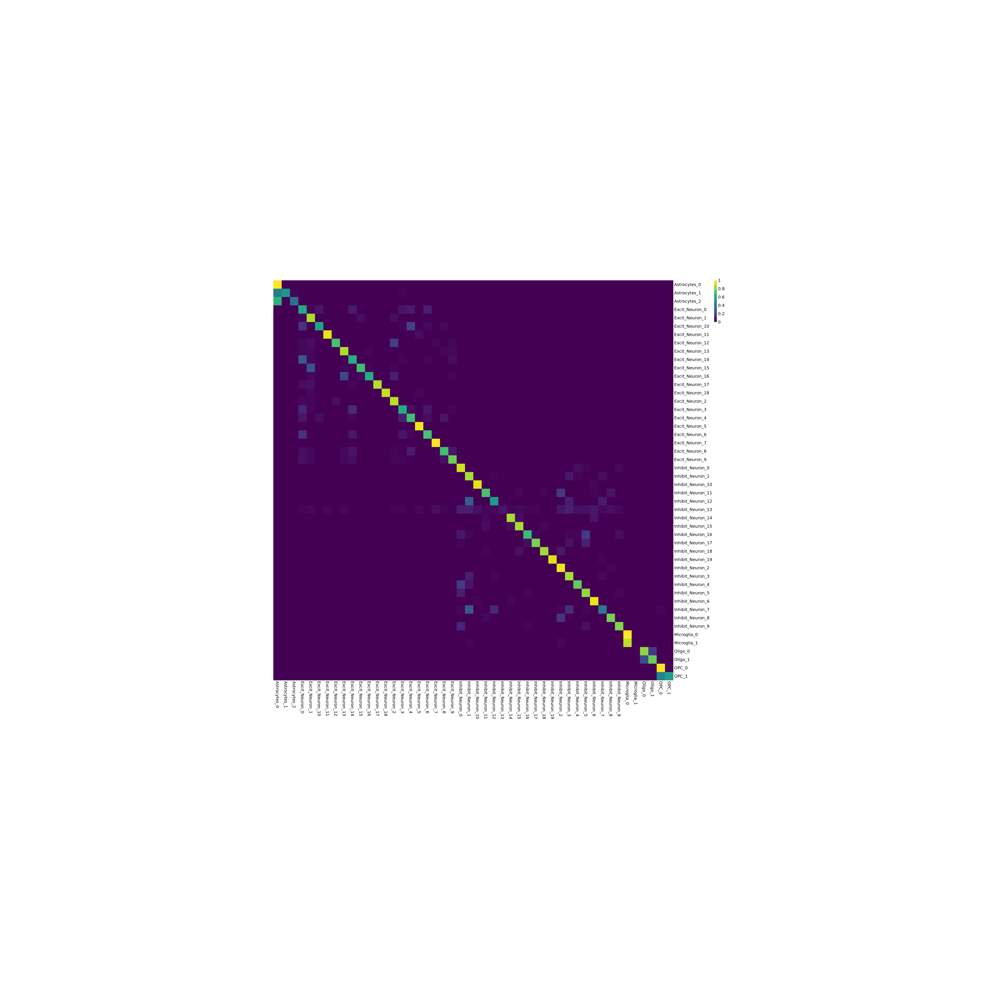

In [6]:

EX_resolution=1.3
IN_resolution=1.1
NON_resolution=0.09

anno_dir='/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/'
anno_file=paste0(anno_dir,EX_resolution,'_res',IN_resolution,'_res',NON_resolution,'_anno.csv')
anno=read.csv(anno_file)
#table(anno$Subclass)


dataDir=anno_dir
saveDir=paste0(dataDir,'train_seurat/')

rf = readRDS(paste0(saveDir, "/Subclass.randomForest.20230627res",EX_resolution,'_res',IN_resolution,".rds"))
str(rf$confusion)
options(repr.plot.width=10, repr.plot.height=5)
plot(rf)

confusionRatio = t(apply(rf$confusion[1:min(dim(rf$confusion)), 1:min(dim(rf$confusion))], 1, function(x) {x/sum(x)}))
options(repr.plot.width=50, repr.plot.height=50)
pheatmap(confusionRatio, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

df_num=as.data.frame(table(anno$Subclass))
select_cell=df_num[df_num$Freq>400,]$Var1

df_num_ex=df_num[grep('Excit',df_num$Var1),]
fil_n=df_num_ex[df_num_ex$Freq<=500,]$Var1

fil_n=as.character(fil_n)
select_cell=as.character(select_cell)
select_cell=setdiff(select_cell,fil_n)
pheatmap(confusionRatio[intersect(rownames(confusionRatio),select_cell),intersect(colnames(confusionRatio),select_cell)]
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

nrow(df_num)
length(select_cell)
ex=select_cell[grep('Ex',select_cell)]
in_=select_cell[grep('In',select_cell)]
non=setdiff(select_cell,c(ex,in_))
length(ex)
length(in_)
length(non)

An object of class Seurat 
45543 features across 80194 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

An object of class Seurat 
45543 features across 77492 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

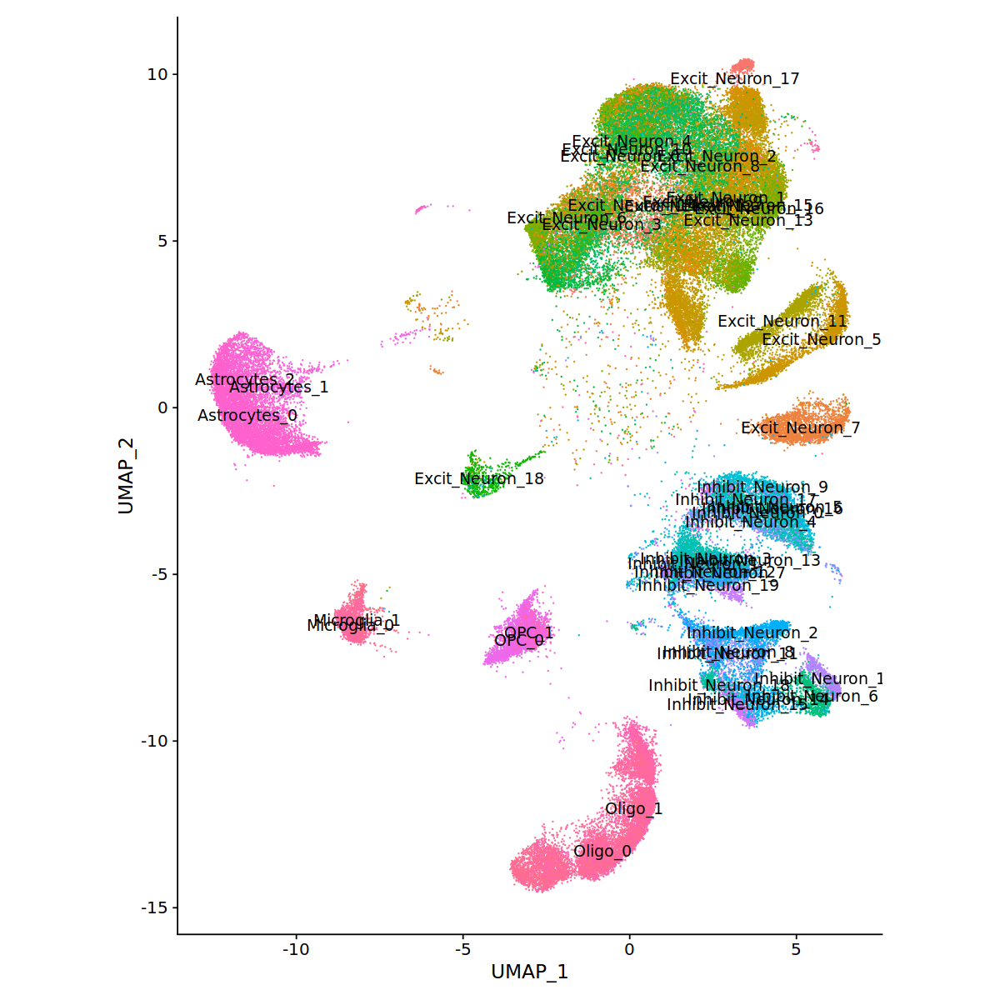

In [3]:

classFiltSeurat=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/insular_snrna_all_soupX_fil300_800_anno_SCT_RFfil_240116.rds')
classFiltSeurat
rownames(anno)=anno$X
anno$X=NULL
classFiltSeurat=AddMetaData(classFiltSeurat,anno)

classFiltSeurat1=subset(classFiltSeurat, Subclass %in% select_cell)
Idents(classFiltSeurat1) = "Subclass"
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1, reduction="umap", label=T,raster=FALSE)+coord_fixed()+NoLegend()
classFiltSeurat1



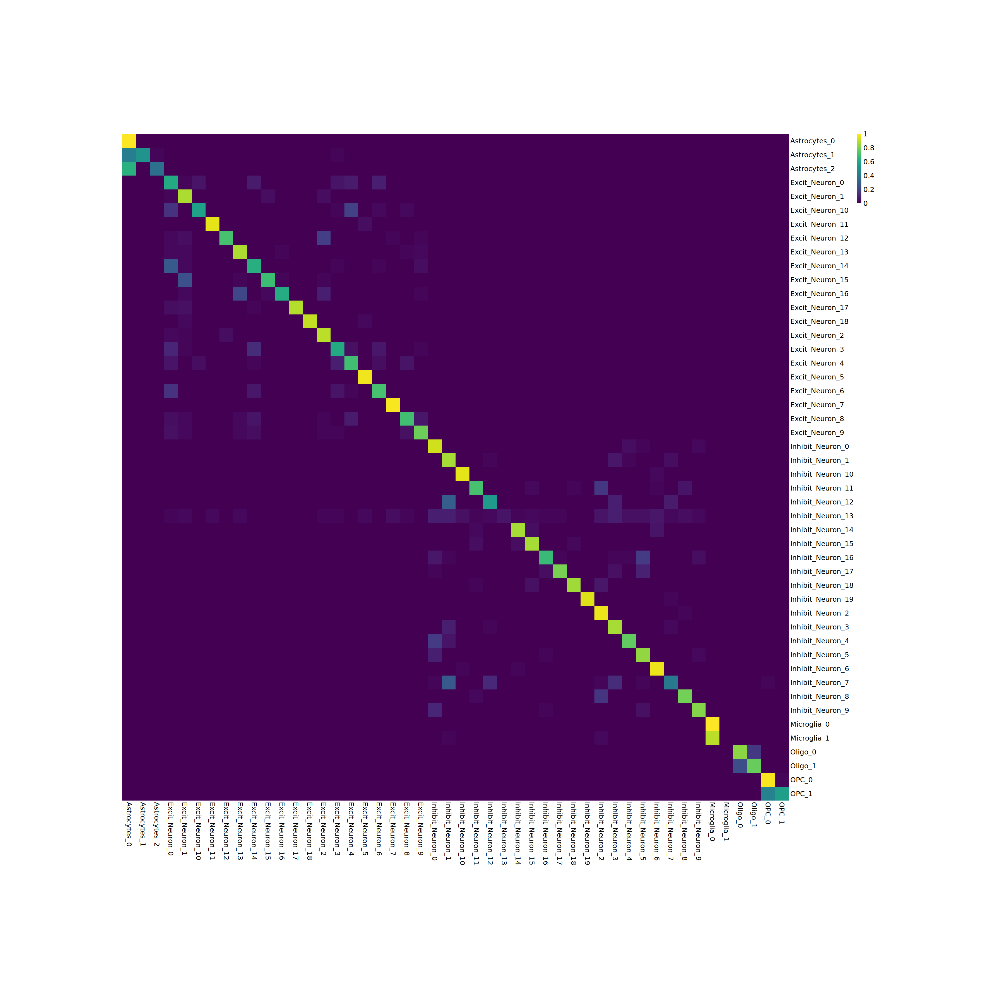

In [4]:
options(repr.plot.width=30, repr.plot.height=30)
pheatmap(confusionRatio[intersect(rownames(confusionRatio),select_cell),intersect(colnames(confusionRatio),select_cell)]
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))


An object of class Seurat 
45543 features across 76527 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

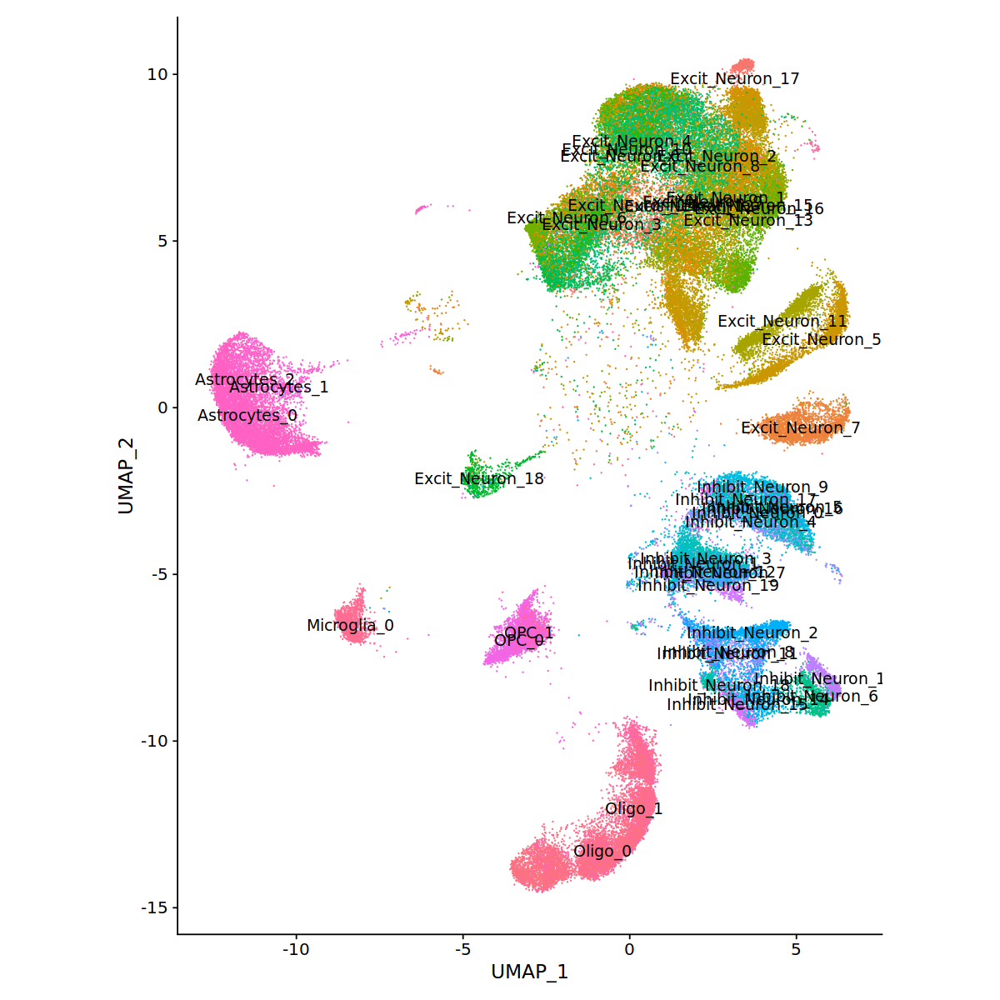

In [5]:

#去掉EX17并保存
select_cell=setdiff(select_cell,c('Inhibit_Neuron_13','Microglia_1'))
classFiltSeurat1=subset(classFiltSeurat, Subclass %in% select_cell)
Idents(classFiltSeurat1) = "Subclass"
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1, reduction="umap", label=T,raster=FALSE)+coord_fixed()+NoLegend()
classFiltSeurat1


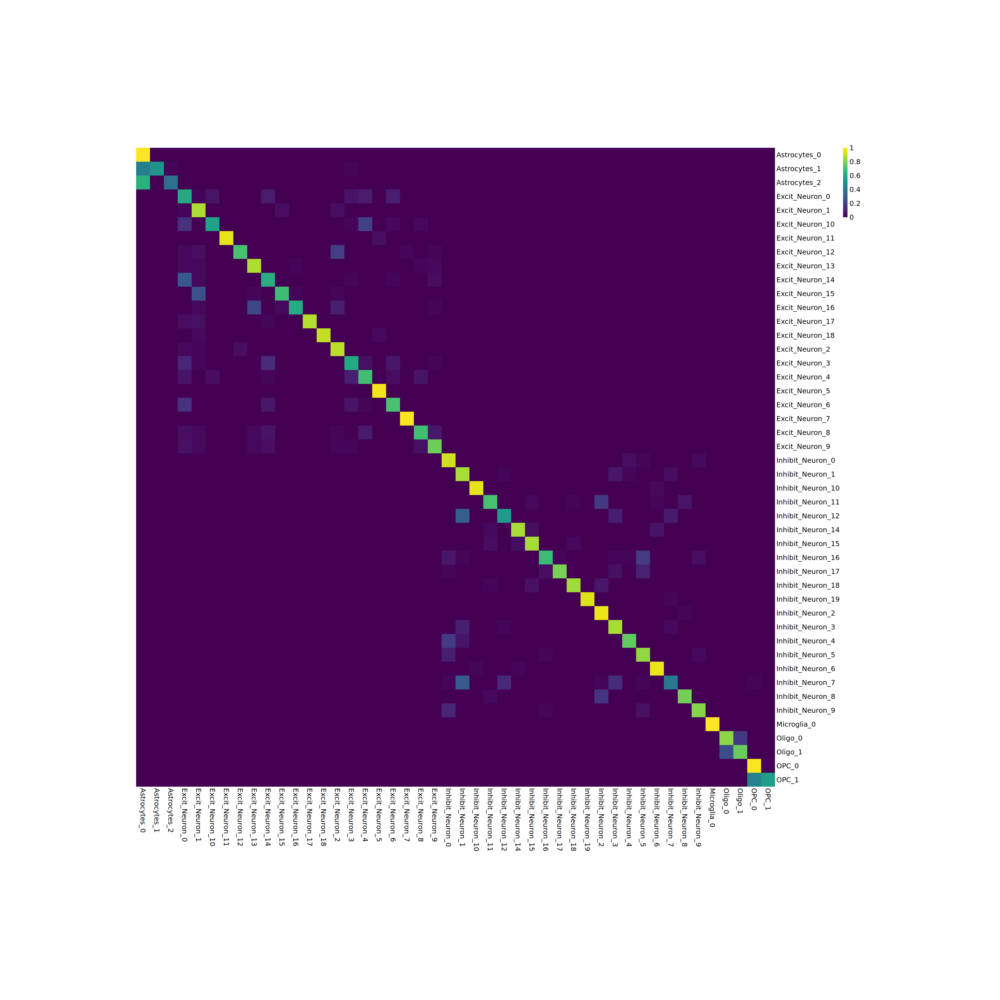

In [6]:
options(repr.plot.width=30, repr.plot.height=30)
pheatmap(confusionRatio[select_cell,select_cell]
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))


Joining, by = c("renew_type", "cell")


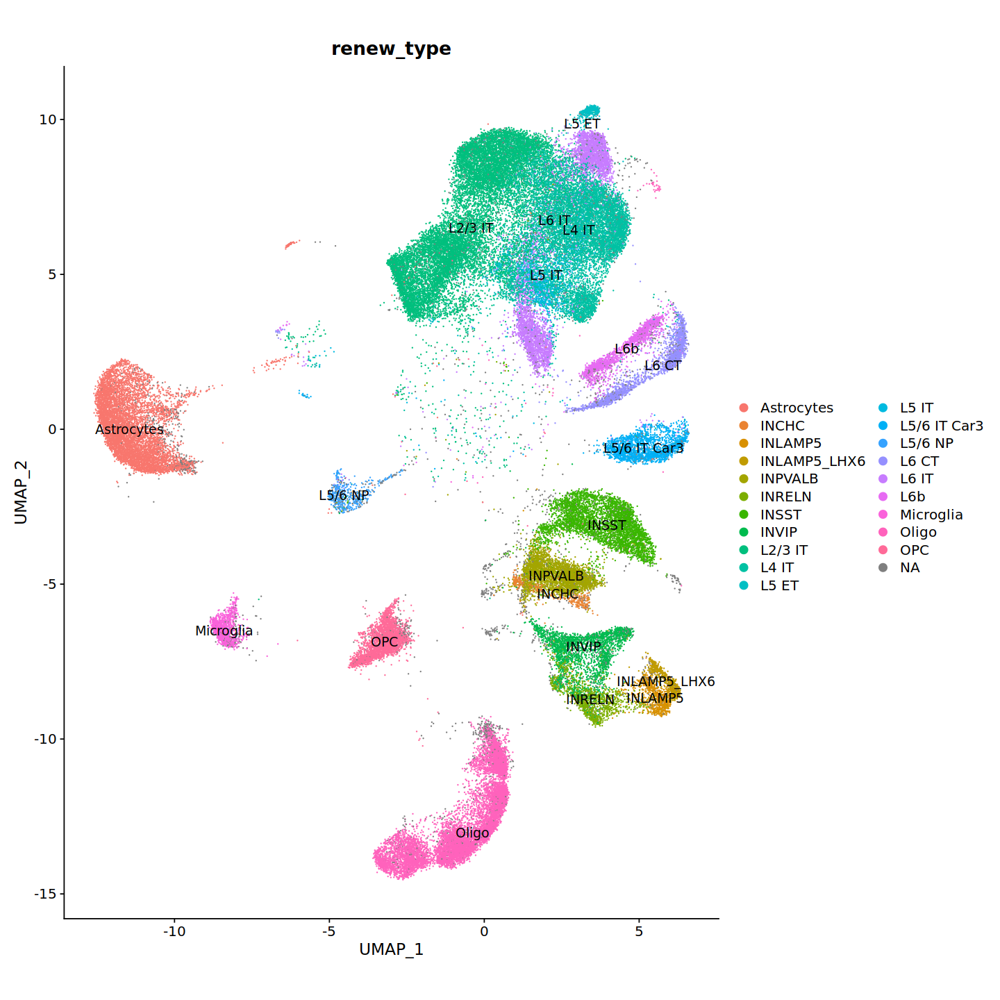

In [7]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')
test=classFiltSeurat1
ref=test@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
test=AddMetaData(test,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(test,group.by = 'renew_type',label=T)+coord_fixed()


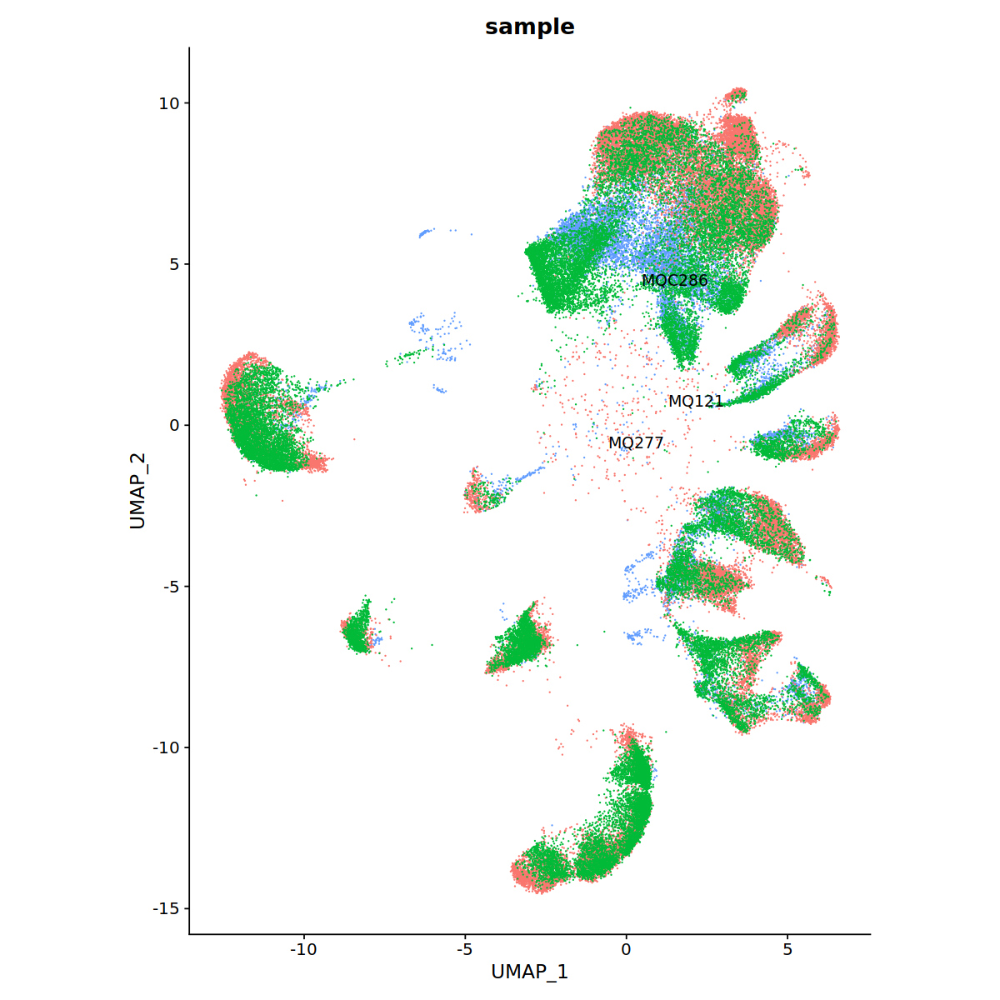

In [8]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat1,group.by = 'sample',label=T,raster=FALSE)+coord_fixed()+NoLegend()


Centering and scaling data matrix

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”
Computing nearest neighbor graph

Computing SNN

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
11:17:26 UMAP embedding parameters a = 0.9922 b = 1.112

11:17:26 Read 76527 rows and found 30 numeric columns

11:17:26 Using Annoy for neighbor search, n_neighbors = 30

11:17:26 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|---

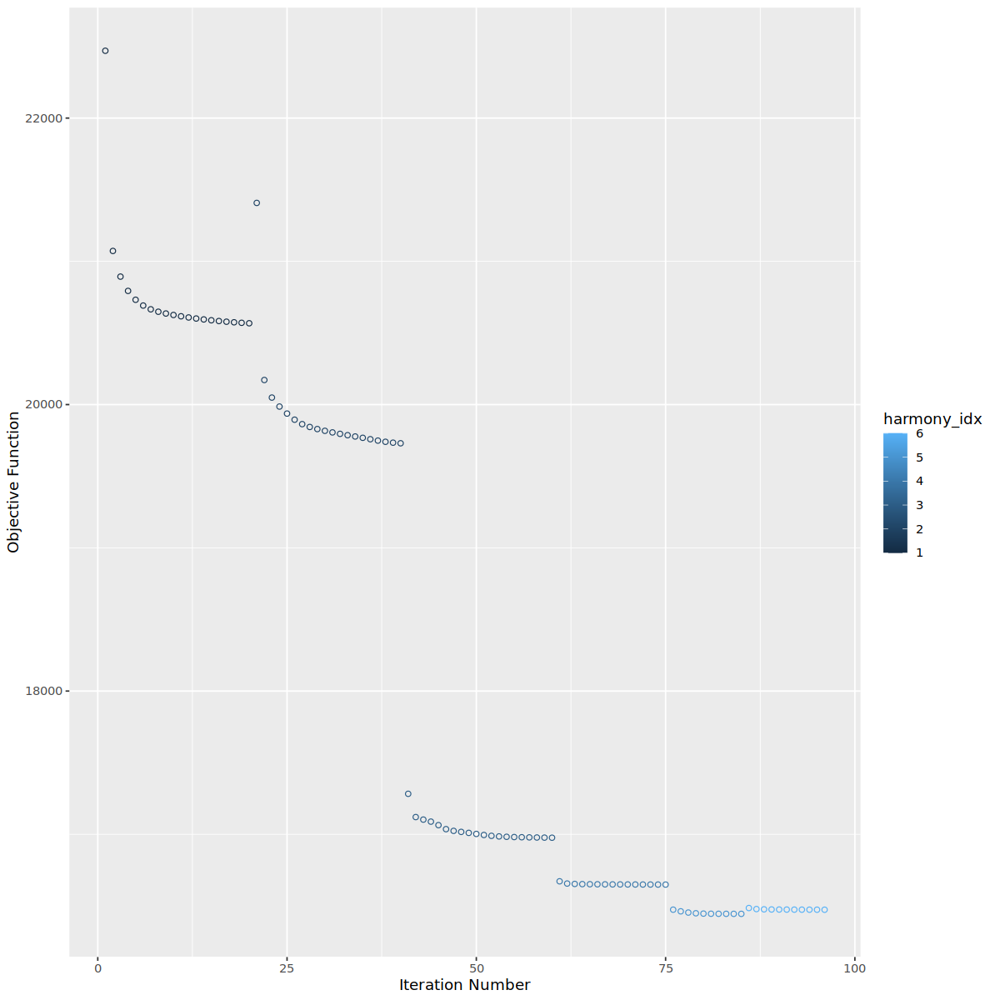

In [9]:
classFiltSeurat=classFiltSeurat1

classFiltSeurat =  NormalizeData(classFiltSeurat, normalization.method = "LogNormalize", scale.factor = 10000)
classFiltSeurat = FindVariableFeatures(classFiltSeurat, selection.method = "vst", nfeatures = nrow(classFiltSeurat))
classFiltSeurat = ScaleData(classFiltSeurat, features = rownames(classFiltSeurat))


classFiltSeurat = RunHarmony(
    classFiltSeurat, group.by.vars="sample", plot_convergence=T, 
    reduction = "pca", dims.use=1:30,
    theta=2,)
classFiltSeurat = classFiltSeurat %>% 
    FindNeighbors(reduction="harmony", dims = 1:30) %>%
    FindClusters(verbose = FALSE) %>%
    RunUMAP(reduction="harmony", dims = 1:30)

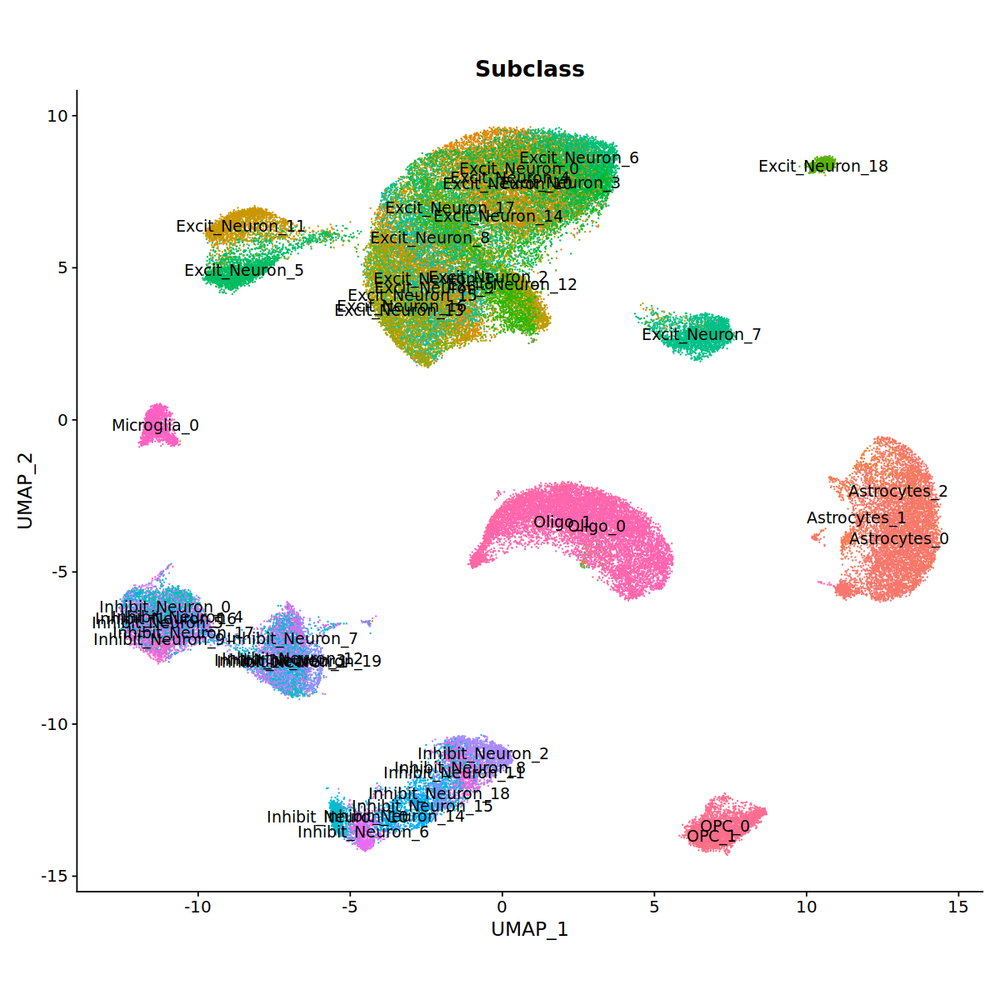

In [10]:
DimPlot(classFiltSeurat,group.by = 'Subclass',label=T,raster=FALSE)+coord_fixed()+NoLegend()


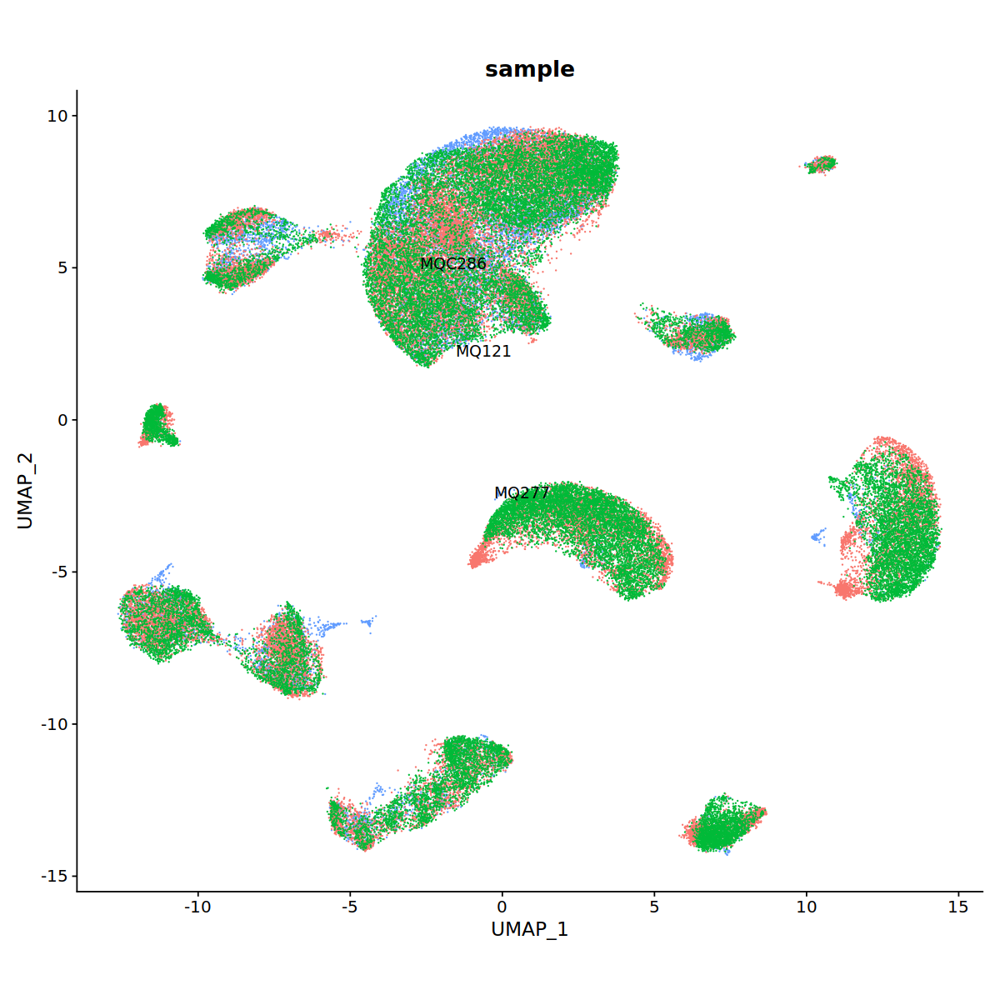

In [12]:
DimPlot(classFiltSeurat,group.by = 'sample',label=T,raster=FALSE)+coord_fixed()+NoLegend()


In [13]:
length(unique(classFiltSeurat$Subclass))

[1] 46

Joining, by = "donor2"
`summarise()` has grouped output by 'Cluster'. You can override using the
`.groups` argument.
Joining, by = "Cluster"


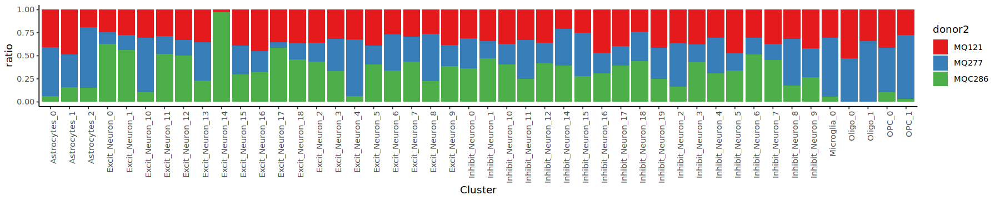

In [14]:
#检验批次效应
insu=classFiltSeurat


df_sum=insu@meta.data
df_sum$donor2=df_sum$sample
df_sum$Cluster=df_sum$Subclass
#normalize
df_sum$num=1
df_donor=as.data.frame(table(df_sum$donor2))
colnames(df_donor)=c('donor2','all_num')
df_donor$ratio=df_donor$all_num/sum(df_donor$all_num)
df_donor$weight=1/df_donor$ratio
df_donor=df_donor[,c('donor2','weight')]
df_sum=left_join(df_sum,df_donor)
df_sum$num=df_sum$num*df_sum$weight

df1=df_sum %>% group_by(Cluster,donor2) %>% summarise(part_num=sum(num))
df2=df_sum %>% group_by(Cluster) %>% summarise(sum_num=sum(num))
df1=left_join(df1,df2)

df1$ratio=df1$part_num/df1$sum_num

#df1$Cluster=factor(df1$Cluster,levels = order)
options(repr.plot.width=15, repr.plot.height=3)

p1=ggplot(data = df1, aes(x = Cluster, y = ratio, fill = donor2)) +
 geom_bar(stat = "identity", position = "stack")+theme_classic()+
scale_fill_manual(values = brewer.pal(9,"Set1"))+ theme(axis.text.x = element_text(angle = 90, vjust = 1, hjust=1))

p1


In [15]:
get_anno=function(area,marker_num){
    area$Cluster=area$Subclass
    cortex=area
    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_1031/dif_res_anno1/train_seurat/train_res1.1_res0.9_res0.15_downsample3000_supercluster_marker.csv')
    sel_type=setdiff(unique(marker$cluster),unique(marker$cluster)[grep('EX',unique(marker$cluster))])
    marker1=marker[marker$cluster %in% sel_type,]

    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/dif_res_anno/marker_Compare.csv')
    all_n=unique(marker$cluster)
    sel=all_n[grep('L[0-9]',all_n)]
    marker2=marker[marker$cluster %in% sel,]

    marker1=marker1[,c('cluster','gene','avg_log2FC','p_val_adj')]
    marker2=marker2[,c('cluster','gene','avg_log2FC','p_val_adj')]
    marker=rbind(marker1,marker2)
    marker=marker[marker$cluster %in% setdiff(unique(marker$cluster),c('OPC','MSN','Endotheial','Microglia',
                                                                      'Astrocytes','Oligo')),]
    marker$renew_name=paste0(marker$cluster,'_',marker$gene)
    marker=marker[!duplicated(marker$renew_name),]

    sort_marker=marker %>% group_by(cluster) %>% top_n(n=marker_num,wt=avg_log2FC)
    sort_marker1=sort_marker[,c('cluster','gene')]
    sort_marker1=as.data.frame(sort_marker1)
    sort_marker1=sort_marker1[order(sort_marker1$cluster),]
    dotplot_genes=sort_marker$gene
    dotplot_genes=intersect(dotplot_genes,rownames(cortex[["SCT"]]@data))
    sort_marker1=sort_marker1[sort_marker1$gene %in% dotplot_genes,]
    sort_marker1=sort_marker1[!duplicated(sort_marker1$gene),]
    dotplot_genes=sort_marker1$gene




    sel_gene=dotplot_genes
    cla=cortex
    df_ref=cortex@meta.data[,'Cluster',drop=F]
    df_ref$cellID=rownames(df_ref)


    df=cla@assays$SCT@counts[sel_gene,]
    df=as.data.frame(t(df))
    df$cellID=rownames(df)

    df=left_join(df,df_ref)
    df$cellID=NULL

    df_re=split(df,df$Cluster)

    i=1
    df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=df_sub
    for(i in c(2:length(names(df_re)))){df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=cbind(df_sum,df_sub)}

    sel=rownames(df_sum)[apply(df_sum,1,sum)==0]
    other=setdiff(rownames(df_sum),sel)
    df_sum=df_sum[other,]

    #df_sum=df_sum[df_sum$EX_VENO>2,]
    df_sum_renew=apply(df_sum,1,function(f){
        f/max(f)
    })
    reorder_matrix <- function(matrix1, by.rows = TRUE) {
      if (by.rows == TRUE) {
        conf.order <- order(apply(matrix1, 1, which.max))
        matrix1.reordered <- matrix1[conf.order, ]
      } else {
        conf.order <- order(apply(matrix1, 2, which.max))
        matrix1.reordered <- matrix1[, conf.order]
      }
    }

    df_sum_renew1 = reorder_matrix(df_sum_renew, by.rows=F)

    #options(repr.plot.width=80, repr.plot.height=30)
    #pheatmap(df_sum_renew1
    #, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,
    #        color = viridis(100),display_numbers = T )

    rownames(sort_marker1)=sort_marker1$gene
    sort_marker1$rename=paste0(sort_marker1$cluster,'_',sort_marker1$gene)
    df_sum_renew2=df_sum_renew1
    colnames(df_sum_renew2)=sort_marker1[colnames(df_sum_renew1),]$rename
    #sel1=sort_marker1[grep('L[0-9].*',sort_marker1$cluster),]$rename

    sel1=sort_marker1$rename
    as=sel1[grep('Astro',sel1)]
    as1=sel1[grep('Oligo',sel1)]
    sel1=setdiff(sel1,c(as,as1))
    sel2=rownames(df_sum_renew2)[grep('Excit',rownames(df_sum_renew2))]
    df_sum_renew3=df_sum_renew2[,intersect(colnames(df_sum_renew2),sel1)]
    df_sum_renew3=t(df_sum_renew3)



    df_sum_renew3=df_sum_renew3[order(rownames(df_sum_renew3)),]

    df_sum_renew4 = reorder_matrix(df_sum_renew3,by.rows = F)
    options(repr.plot.width=30, repr.plot.height=40)

    name=str_extract(rownames(df_sum_renew4),'.*_')
    name=gsub('_','',name)
    df_sum_renew4=as.data.frame(df_sum_renew4)
    df_sum_renew4$reorder=name
    df_sum_renew4_list=split(df_sum_renew4,df_sum_renew4$reorder)

    aba_all=data.frame()
    df=df_sum_renew4_list[[1]]
    df=as.data.frame(df)
    df$reorder=NULL
    aba=apply(df,2,mean)
    aba_all=rbind(aba_all,aba)
    colnames(aba_all)=names(aba)

    for(i in c(2:length(df_sum_renew4_list))){
        df=df_sum_renew4_list[[i]]
        df=as.data.frame(df)
        df$reorder=NULL
        aba=apply(df,2,mean)
        aba_all=rbind(aba_all,aba)

    }

    rownames(aba_all)=names(df_sum_renew4_list)

    df_sum=data.frame()
    for(i in c(1:ncol(aba_all))){
        cell=colnames(aba_all)[i]
        type=rownames(aba_all)[aba_all[,i]==max(aba_all[,i])]
        df_sum=rbind(df_sum,c(cell,type))
        }
    return(df_sum)
}


Joining, by = "cellID"
Joining, by = "Subclass"


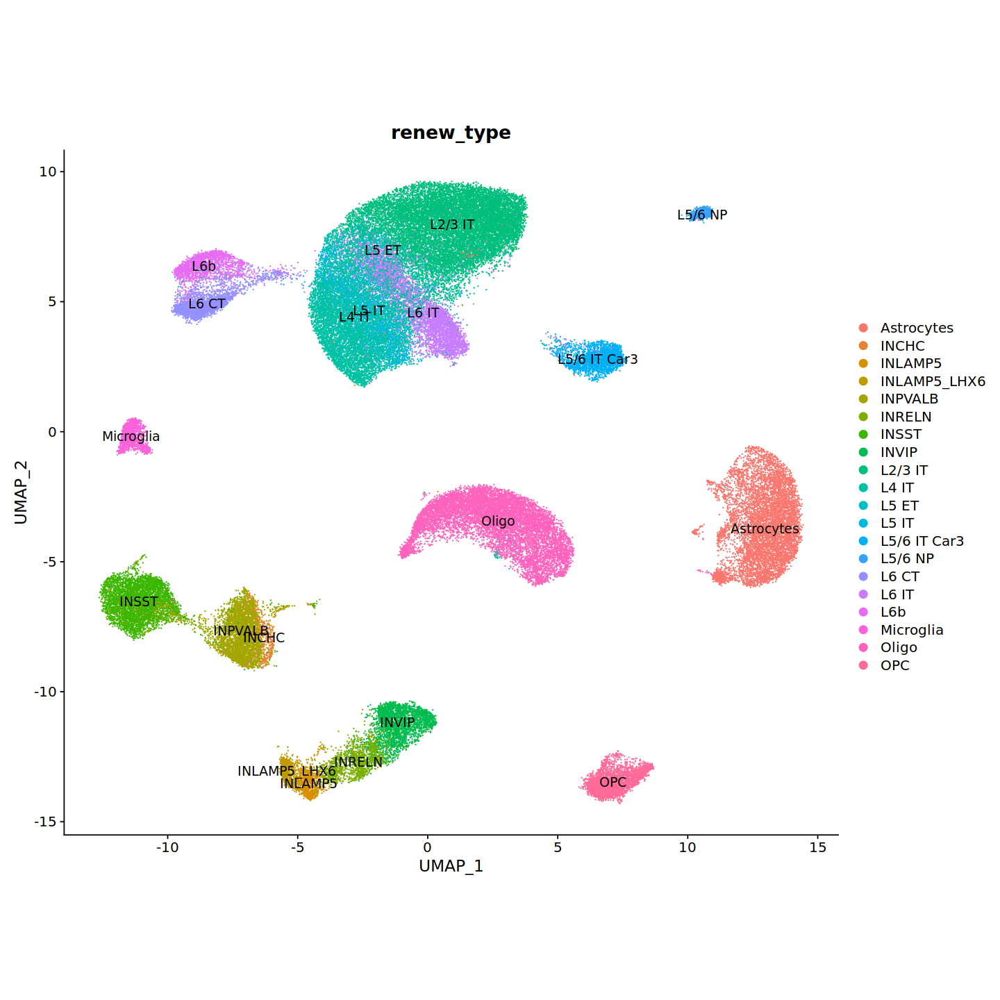

In [32]:
#Insular重新整理(带layer)
df_sum=get_anno(insu,20)
colnames(df_sum)=c('Subclass','renew_type')
df_sum[grep('Astrocytes',df_sum$Subclass),]$renew_type='Astrocytes'
df_sum[grep('OPC',df_sum$Subclass),]$renew_type='OPC'
df_sum[grep('Oligo',df_sum$Subclass),]$renew_type='Oligo'
df_sum[grep('Microglia',df_sum$Subclass),]$renew_type='Microglia'

#df_sum[df_sum$Subclass %in% c('Inhibit_Neuron_15'),]$renew_type='INSST'
df_sum[df_sum$Subclass %in% c('Inhibit_Neuron_10'),]$renew_type='INLAMP5_LHX6'
df_sum[df_sum$Subclass %in% c('Excit_Neuron_11'),]$renew_type='L6b'
df_sum[df_sum$Subclass %in% c('Excit_Neuron_15','Excit_Neuron_9',
                             'Excit_Neuron_16','Excit_Neuron_13','Excit_Neuron_8'),]$renew_type='L4 IT'
df_sum[df_sum$Subclass %in% c('Excit_Neuron_1'),]$renew_type='L5 IT'
df_sum[df_sum$Subclass %in% c('Excit_Neuron_17'),]$renew_type='L5 ET'


area=insu
ref=area@meta.data[,'Subclass',drop=F]
ref$ID=rownames(ref)
colnames(df_sum)=c('Subclass','renew_type')
ref=left_join(ref,df_sum)
area=AddMetaData(area,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(area,group.by = 'renew_type',label=T)+coord_fixed()



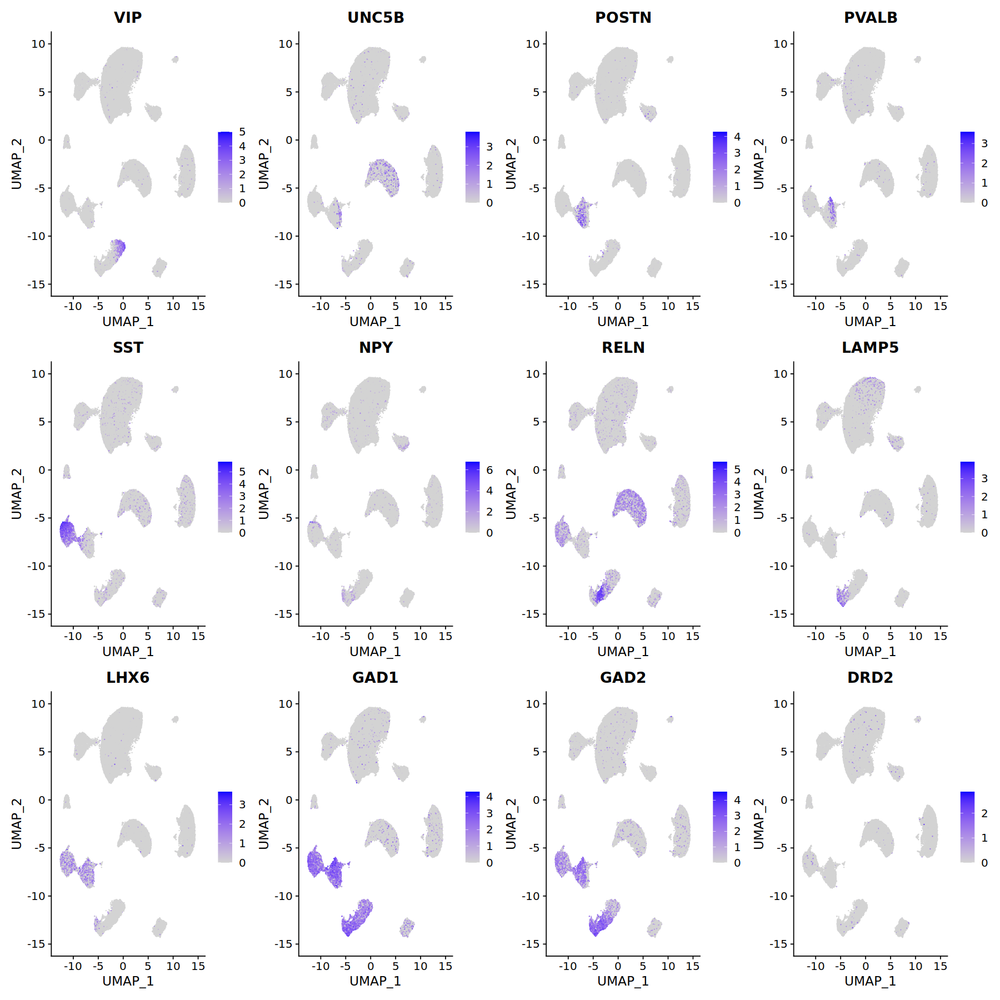

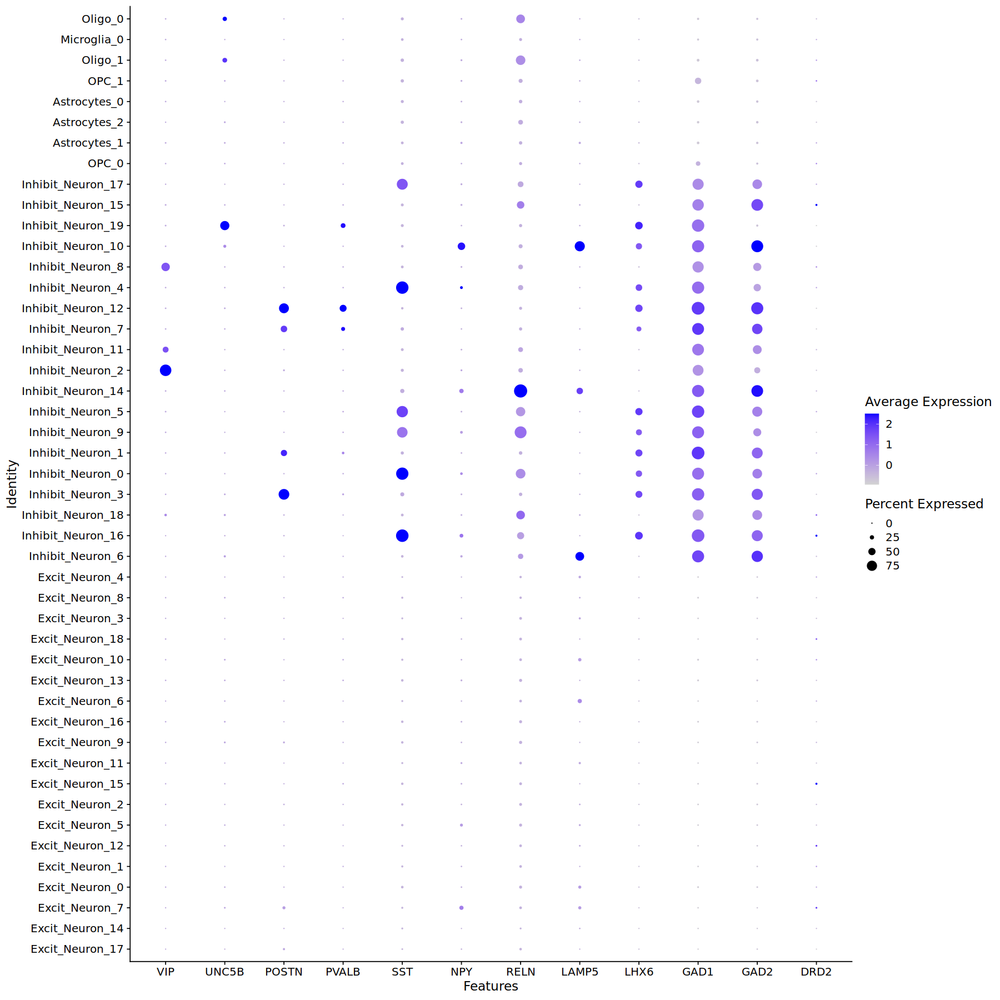

In [17]:

classMarkerTop = c('VIP','UNC5B','POSTN','PVALB','SST','NPY','RELN','LAMP5','LHX6','GAD1','GAD2','DRD2')
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(classFiltSeurat, features = classMarkerTop,raster=FALSE)
Idents(classFiltSeurat)='Subclass'
DotPlot(classFiltSeurat, features = classMarkerTop)

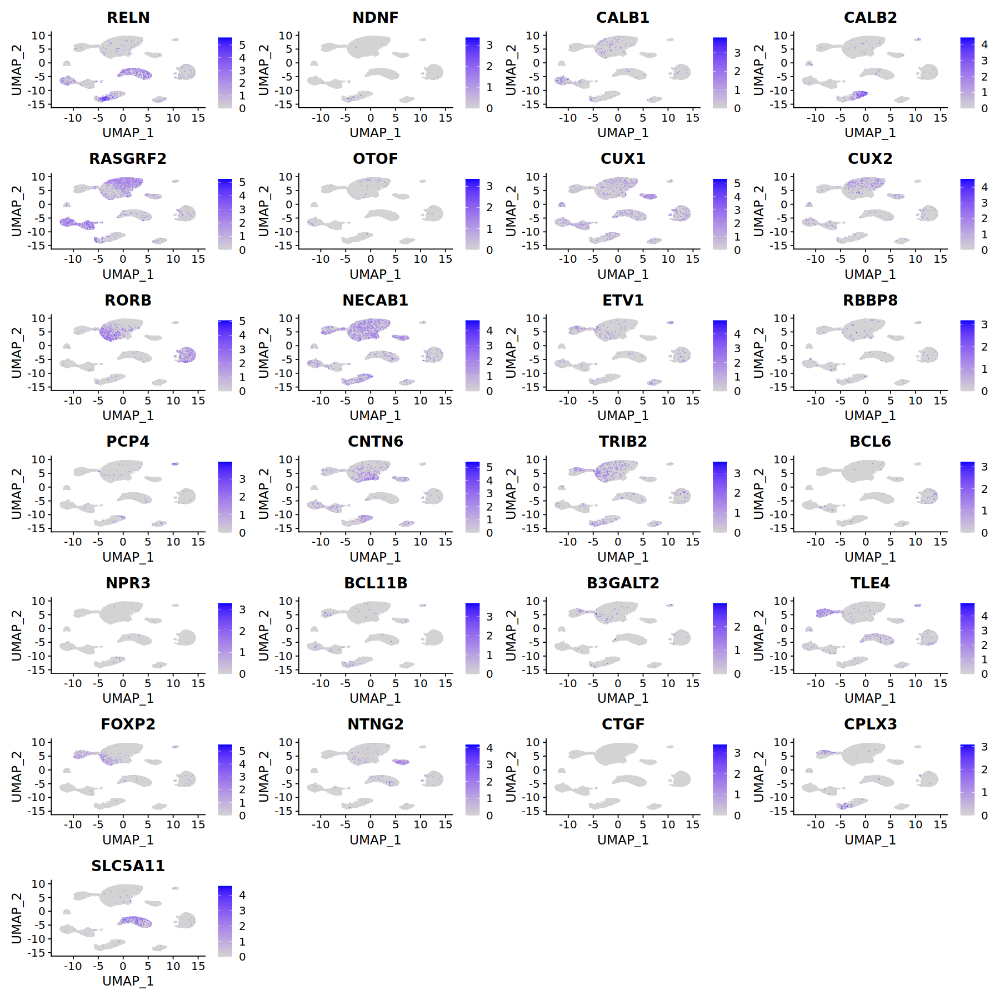

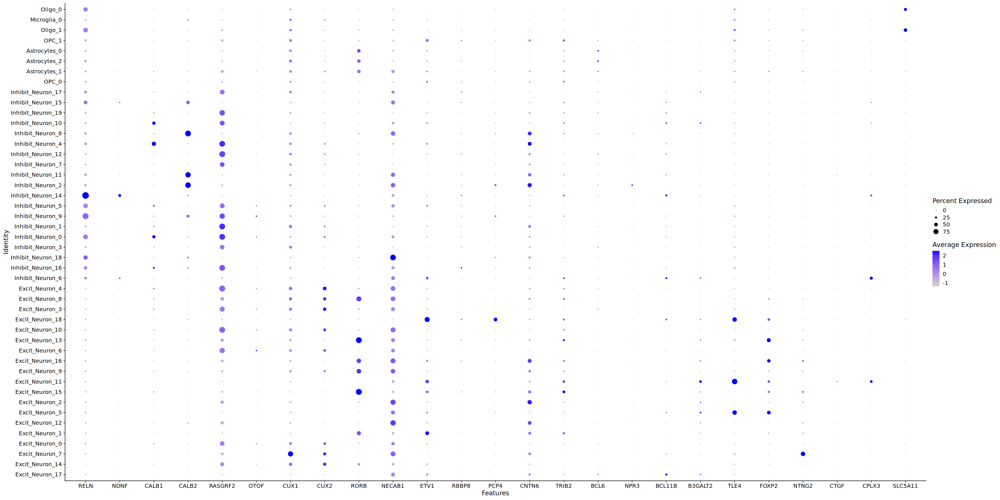

In [23]:
selectMarkers = c(
    "Reln", "NDNF", # L1
    "CALB1", "CALB2", "RASGRF2", "Otof", # L2/3
    "Cux1", "Cux2", # L2/3-4
    "RORB", "NECAB1", # L4
    "ETV1", "RBBP8", "PCP4", "CNTN6", "TRIB2", # L5
    "Bcl6", "Npr3", # L5 PT
    "BCL11B", "B3GALT2", # L5-L6
    "Tle4", "FOXP2", "NTNG2", # L6
    "CTGF", "Cplx3", # L6b
    "SLC5A11" # WM
)
selectMarkers=toupper(selectMarkers)
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(classFiltSeurat, features = selectMarkers,raster=FALSE)
options(repr.plot.width=30, repr.plot.height=15)
Idents(classFiltSeurat)='Subclass'
DotPlot(classFiltSeurat, features = selectMarkers)


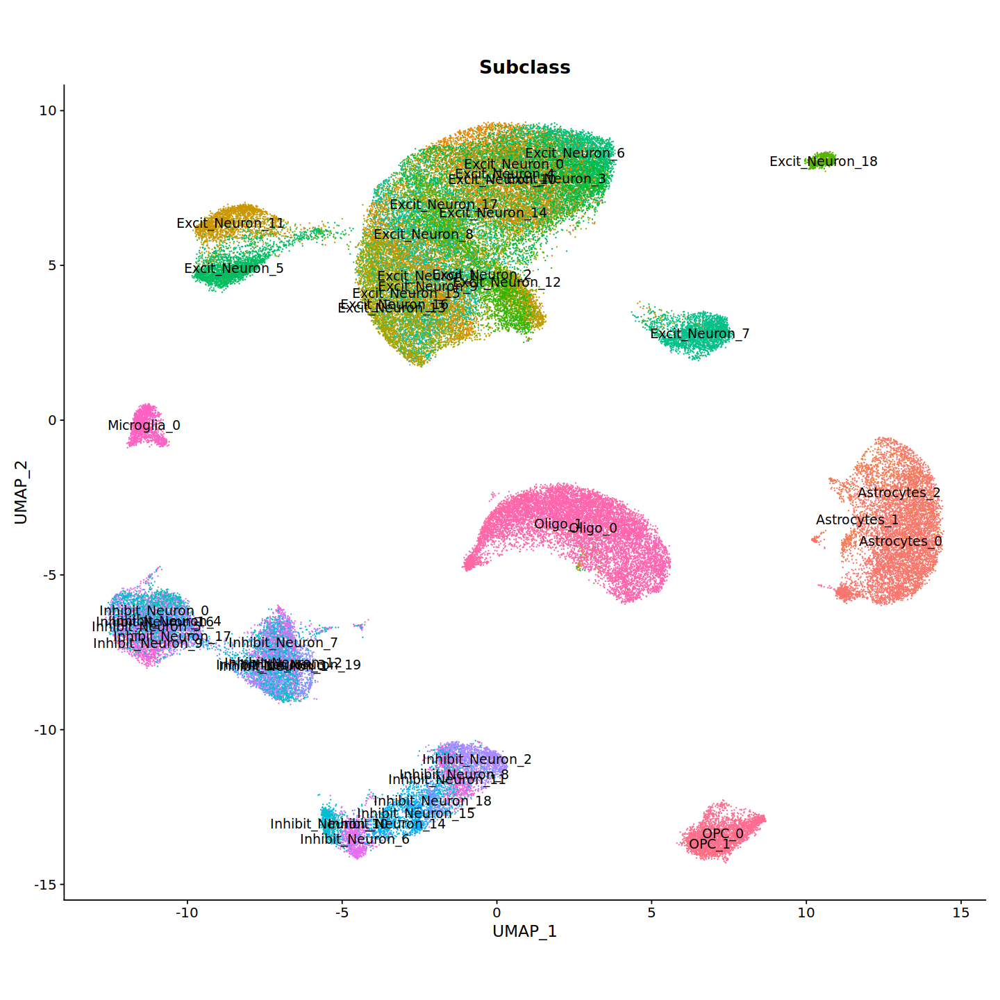

In [18]:
options(repr.plot.width=12, repr.plot.height=12)
DimPlot(area,group.by = 'Subclass',label=T)+coord_fixed()+NoLegend()



Joining, by = c("renew_type", "cell")


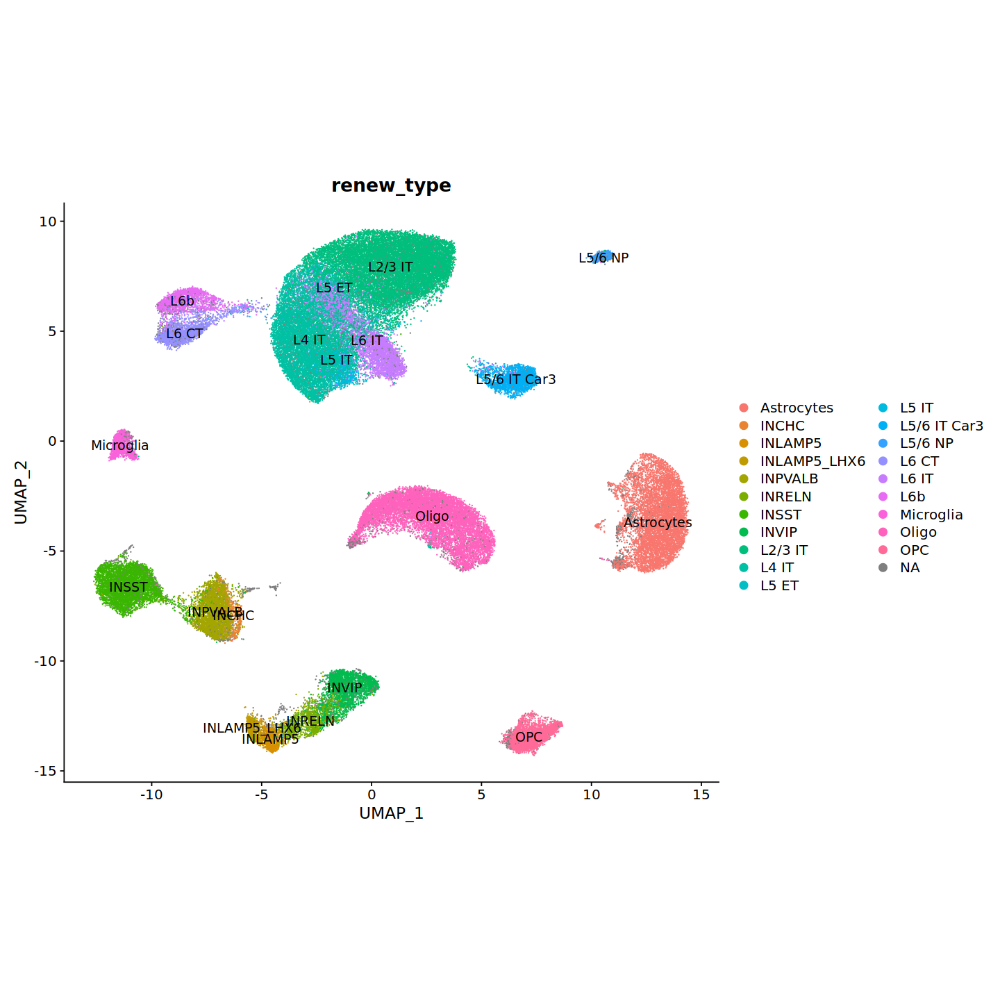

In [19]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')
test=insu
ref=test@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
test=AddMetaData(test,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(test,group.by = 'renew_type',label=T)+coord_fixed()


In [31]:
df=test@meta.data[,c('renew_type','Subclass')]
table(df[df$renew_type=='L5 ET',]$Subclass)
table(df[df$renew_type=='L4 IT',]$Subclass)
table(df[df$renew_type=='L5 IT',]$Subclass)


 Excit_Neuron_0  Excit_Neuron_1 Excit_Neuron_14 Excit_Neuron_17  Excit_Neuron_6 
              2               1               1             650               1 
 Excit_Neuron_7 
              1 


 Excit_Neuron_0  Excit_Neuron_1 Excit_Neuron_10 Excit_Neuron_11 Excit_Neuron_12 
             47            1735              19               1              34 
Excit_Neuron_13 Excit_Neuron_14 Excit_Neuron_15 Excit_Neuron_16 Excit_Neuron_18 
           1743             108            1112            1007               1 
 Excit_Neuron_2  Excit_Neuron_3  Excit_Neuron_4  Excit_Neuron_5  Excit_Neuron_8 
             34              72             223               5            1486 
 Excit_Neuron_9 
           1623 


 Excit_Neuron_0  Excit_Neuron_1 Excit_Neuron_11 Excit_Neuron_12 Excit_Neuron_14 
              1            1224               1              17               4 
Excit_Neuron_15 Excit_Neuron_18  Excit_Neuron_2  Excit_Neuron_3  Excit_Neuron_5 
            178               1               3               3               1 
 Excit_Neuron_6  Excit_Neuron_8 
              1               1 

In [33]:
classFiltSeurat2=area


unique(classFiltSeurat2$Subclass)
classFiltSeurat2$SuperCluster=classFiltSeurat2$renew_type
classFiltSeurat2$SuperCluster=gsub('^L','GLUT_L',classFiltSeurat2$SuperCluster)
classFiltSeurat2$SuperCluster=gsub('IN','GABA_',classFiltSeurat2$SuperCluster)
#classFiltSeurat2$SuperCluster=gsub('MSN','GABA_DRD2',classFiltSeurat2$SuperCluster)
unique(classFiltSeurat2$SuperCluster)


[1] "Excit_Neuron_17"   "Excit_Neuron_14"   "Excit_Neuron_7"   
 [4] "Excit_Neuron_0"    "Excit_Neuron_1"    "Excit_Neuron_12"  
 [7] "Excit_Neuron_5"    "Excit_Neuron_2"    "Excit_Neuron_15"  
[10] "Excit_Neuron_11"   "Excit_Neuron_9"    "Excit_Neuron_16"  
[13] "Excit_Neuron_6"    "Excit_Neuron_13"   "Excit_Neuron_10"  
[16] "Excit_Neuron_18"   "Excit_Neuron_3"    "Excit_Neuron_8"   
[19] "Excit_Neuron_4"    "Inhibit_Neuron_6"  "Inhibit_Neuron_16"
[22] "Inhibit_Neuron_18" "Inhibit_Neuron_3"  "Inhibit_Neuron_0" 
[25] "Inhibit_Neuron_1"  "Inhibit_Neuron_9"  "Inhibit_Neuron_5" 
[28] "Inhibit_Neuron_14" "Inhibit_Neuron_2"  "Inhibit_Neuron_11"
[31] "Inhibit_Neuron_7"  "Inhibit_Neuron_12" "Inhibit_Neuron_4" 
[34] "Inhibit_Neuron_8"  "Inhibit_Neuron_10" "Inhibit_Neuron_19"
[37] "Inhibit_Neuron_15" "Inhibit_Neuron_17" "OPC_0"            
[40] "Astrocytes_1"      "Astrocytes_2"      "Astrocytes_0"     
[43] "OPC_1"             "Oligo_1"           "Microglia_0"      
[46] "Oligo_0"

[1] "GLUT_L5 ET"        "GLUT_L2/3 IT"      "GLUT_L5/6 IT Car3"
 [4] "GLUT_L5 IT"        "GLUT_L6 IT"        "GLUT_L6 CT"       
 [7] "GLUT_L4 IT"        "GLUT_L6b"          "GLUT_L5/6 NP"     
[10] "GABA_LAMP5"        "GABA_SST"          "GABA_RELN"        
[13] "GABA_PVALB"        "GABA_VIP"          "GABA_LAMP5_LHX6"  
[16] "GABA_CHC"          "OPC"               "Astrocytes"       
[19] "Oligo"             "Microglia"

In [34]:
#
classFiltSeurat3=classFiltSeurat2
classFiltSeurat3$id=str_extract(classFiltSeurat3$Subclass,'_[0-9]*$')
classFiltSeurat3$Cluster=paste0(classFiltSeurat3$SuperCluster,classFiltSeurat3$id)
length(unique(classFiltSeurat3$Cluster))
unique(classFiltSeurat3$Cluster)

[1] 46

[1] "GLUT_L5 ET_17"       "GLUT_L2/3 IT_14"     "GLUT_L5/6 IT Car3_7"
 [4] "GLUT_L2/3 IT_0"      "GLUT_L5 IT_1"        "GLUT_L6 IT_12"      
 [7] "GLUT_L6 CT_5"        "GLUT_L6 IT_2"        "GLUT_L4 IT_15"      
[10] "GLUT_L6b_11"         "GLUT_L4 IT_9"        "GLUT_L4 IT_16"      
[13] "GLUT_L2/3 IT_6"      "GLUT_L4 IT_13"       "GLUT_L2/3 IT_10"    
[16] "GLUT_L5/6 NP_18"     "GLUT_L2/3 IT_3"      "GLUT_L4 IT_8"       
[19] "GLUT_L2/3 IT_4"      "GABA_LAMP5_6"        "GABA_SST_16"        
[22] "GABA_RELN_18"        "GABA_PVALB_3"        "GABA_SST_0"         
[25] "GABA_PVALB_1"        "GABA_SST_9"          "GABA_SST_5"         
[28] "GABA_RELN_14"        "GABA_VIP_2"          "GABA_VIP_11"        
[31] "GABA_PVALB_7"        "GABA_PVALB_12"       "GABA_SST_4"         
[34] "GABA_VIP_8"          "GABA_LAMP5_LHX6_10"  "GABA_CHC_19"        
[37] "GABA_RELN_15"        "GABA_PVALB_17"       "OPC_0"              
[40] "Astrocytes_1"        "Astrocytes_2"        "Astrocytes_0"       
[43] "OPC_1"               "Oligo_1"             "Microglia_0"        
[46] "Oligo_0"

In [35]:
classFiltSeurat3@meta.data[,c('Cluster','SuperCluster')]

,Cluster,SuperCluster
,<chr>,<chr>
6121-1_CELL916_N2,GLUT_L5 ET_17,GLUT_L5 ET
6121-1_CELL1664_N1,GLUT_L2/3 IT_14,GLUT_L2/3 IT
6121-1_CELL257_N3,GLUT_L5/6 IT Car3_7,GLUT_L5/6 IT Car3
6121-1_CELL1534_N1,GLUT_L2/3 IT_14,GLUT_L2/3 IT
6121-1_CELL3855_N1,GLUT_L2/3 IT_0,GLUT_L2/3 IT
6121-1_CELL1719_N1,GLUT_L2/3 IT_14,GLUT_L2/3 IT
6121-1_CELL1011_N2,GLUT_L2/3 IT_14,GLUT_L2/3 IT
6121-1_CELL956_N2,GLUT_L2/3 IT_14,GLUT_L2/3 IT
6121-1_CELL2113_N1,GLUT_L2/3 IT_14,GLUT_L2/3 IT


In [36]:
saveRDS(classFiltSeurat3,'/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/final_anno/46cl_240122_Cluster_Supercluster_res11.rds')



In [37]:
classFiltSeurat3

An object of class Seurat 
45543 features across 76527 samples within 2 assays 
Active assay: SCT (22313 features, 22313 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

In [1]:
classFiltSeurat3=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/final_anno/46cl_240122_Cluster_Supercluster_res11.rds')



rgeos version: 0.6-3, (SVN revision 696)
 GEOS runtime version: 3.11.0-CAPI-1.17.0 
 Please note that rgeos will be retired during October 2023,
plan transition to sf or terra functions using GEOS at your earliest convenience.
See https://r-spatial.org/r/2023/05/15/evolution4.html for details.
 GEOS using OverlayNG
 Linking to sp version: 1.6-0 
 Polygon checking: TRUE 




In [7]:
meta=classFiltSeurat3@meta.data
write.csv(meta,'/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/final_anno/46cl_240122_Cluster_Supercluster_res11_meta.csv')


In [ ]:
meta=read.csv('')

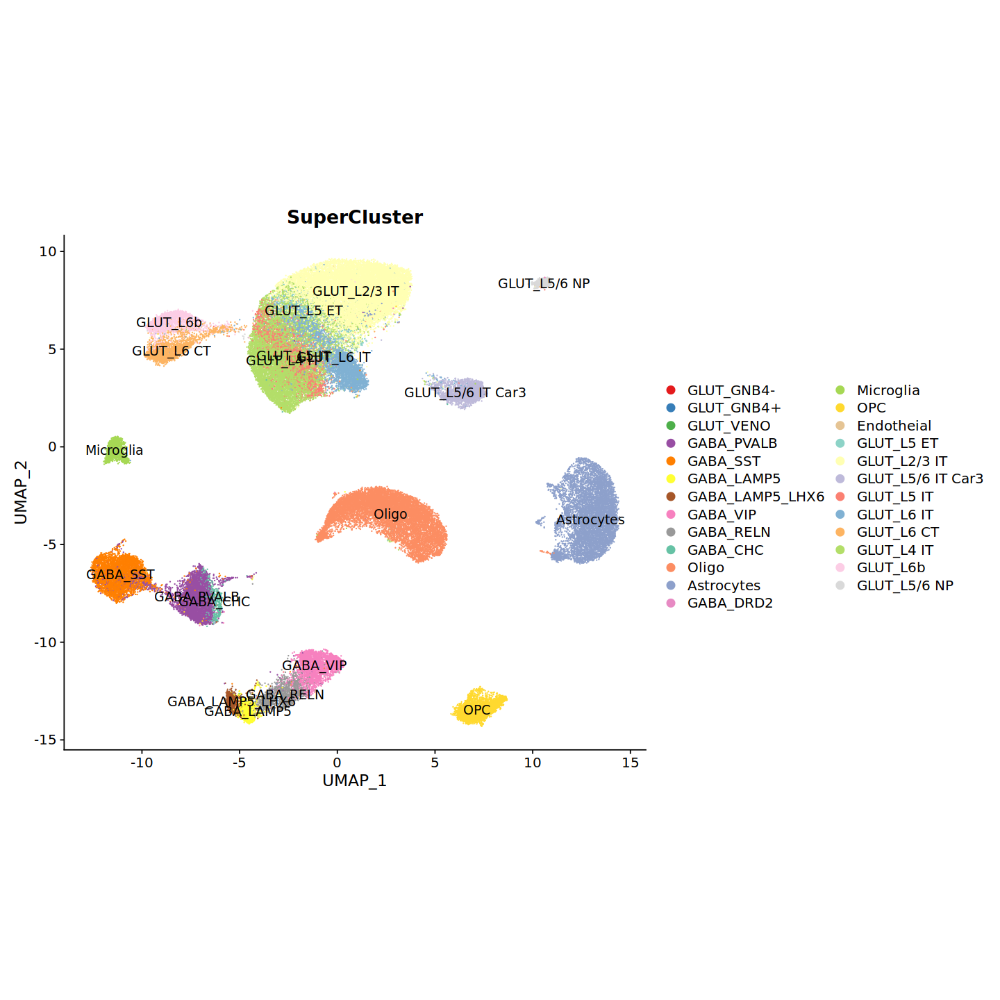

In [4]:
df_col=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/color_supercluster.csv')
need=setdiff(unique(classFiltSeurat3$SuperCluster),df_col$X)
for(i in c(1:length(need))){
    df_col=rbind(df_col,c(need[i],brewer.pal(9,"Set3")[i]))
}
col=df_col$pale
names(col)=df_col$X

options(repr.plot.width=12, repr.plot.height=12)
gp=DimPlot(classFiltSeurat3,group.by = 'SuperCluster',label=T,cols = col)+coord_fixed()
gp

In [6]:

write.csv(as.data.frame(col),'/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_0105/post_analysis/data/color_supercluster_all_insu.csv')


In [11]:
pdf("/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig2_renew_240118/sup_insular_umap.pdf", width=12, height=12)
gp
dev.off()

png 
  2

png 
  2

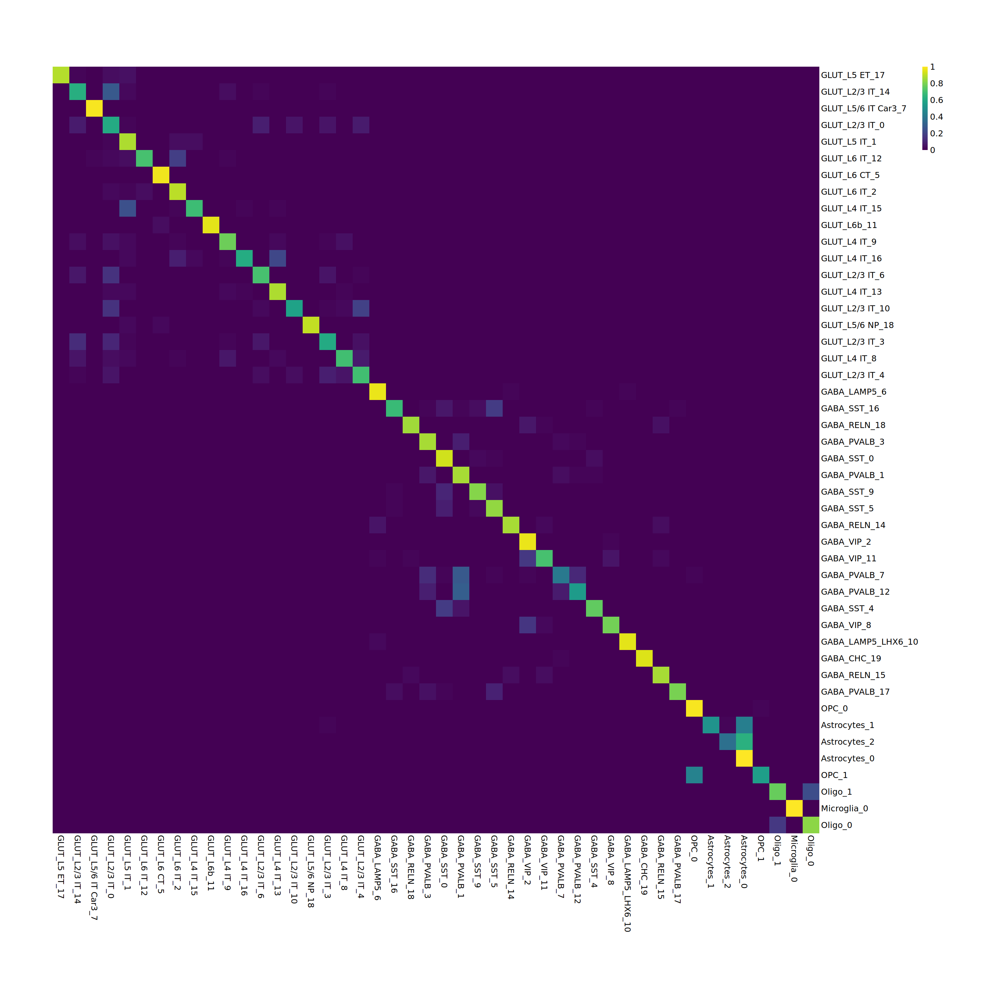

In [8]:
options(repr.plot.width=25, repr.plot.height=25)
df=confusionRatio[unique(classFiltSeurat3$Subclass),unique(classFiltSeurat3$Subclass)]
df_ref=classFiltSeurat3@meta.data[,c('Subclass','Cluster')]
df_ref=df_ref[!duplicated(df_ref),]
rownames(df_ref)=df_ref$Subclass
rownames(df)=df_ref[rownames(df),]$Cluster
colnames(df)=df_ref[colnames(df),]$Cluster

gp=pheatmap(df
, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,color = viridis(100))

save_pheatmap_pdf <- function(x, filename, width=15, height=15) {
  stopifnot(!missing(x))
  stopifnot(!missing(filename))
  pdf(filename, width=width, height=height)
  grid::grid.newpage()
  grid::grid.draw(x$gtable)
  dev.off()
}

save_pheatmap_pdf(gp,"/home/liuyx/liuyuxuan/spa_seurat/cla/fig_1206/fig2_renew_240118/sup_insular_RF.pdf",25,25)

